In [1]:
from snappy import ProductIO
from snappy import jpy
from snappy import GPF

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline

import numpy as np

from sentinelsat.sentinel import SentinelAPI, read_geojson, geojson_to_wkt
from datetime import date
from datetime import timedelta
from datetime import datetime

import zipfile
import os 
import time
import shutil
import pickle

from sklearn import datasets
from sklearn import decomposition
from sklearn.decomposition import PCA
import scipy.linalg as la
import numpy.matlib

In [2]:
def  eigen(a,b):
    d1,v1 = la.eig(a,b, left=False, right=True)
    d2 = np.diag(d1)
    sort_index = np.argsort(d2) # on cherche juste les index triés
    v = v1
    for i in range(d2.shape[0]):
        v[i,:] = v1[i,sort_index[i,:]]
    dtmp = d2
    for i in range(d2.shape[0]):
        dtmp[i,:] = d2[i,sort_index[i,:]]
    d = np.diag(dtmp)
    return v,d

def crea_x(x,nrow=125,ncol=125):
    X = np.zeros((len(x)-1,nrow*ncol,))
    for i in range(len(x)-1):
        X[i] = np.reshape(x[i],(1,nrow*ncol))
    X = X-np.mean(X)
    return X

def sort_data(data):
    sorted_data = []
    idx = []
    for i in range(len(data)):
        idx.append(data[i][16][0])

    for i in range(len(data)):
        sorted_data.append(data[numpy.argsort(idx)[i]])
    return sorted_data

# filtre des incohérences, Hautes valeurs
def HV_filtre(time_detect,coef_sigma):
    time_detectf = []
    Sigmas = []
    for j in range(len(time_detect)):
        T = time_detect[j]
        Var = np.mean(T[4000:]**2)-np.mean(T[4000:])**2
        sigma = np.sqrt(Var)
        Sigmas.append(sigma)
        Tf = T.copy()

        for i in range(len(time_detect[0])):
            if T[i] > coef_sigma*sigma:
                Tf[i]=0
        time_detectf.append(Tf)
    return time_detectf, Sigmas

In [3]:
def detect_btw(data,id_im1,id_im2):
    x = data[id_im1] 
    y = data[id_im2]
    
    xbands = len(data[0])-1
    ybands = xbands
    
    nrows = x[0].shape[0] 
    ncols = x[0].shape[1]
    N = nrows * ncols
    
    X = crea_x(x)  # x.shape = N,xbands (col,row)
    Y = crea_x(y)  # y.shape = N,ybands (col,row)

    covxy = np.cov(np.concatenate((X,Y)))
    s11 = covxy[0:xbands,0:xbands]
    s22 = covxy[xbands:,xbands:]
    s12 = covxy[0:xbands,xbands:]
    s21 = s12.T
    ### ici xbands = ybands => resolution du plus petit problème :

    s22i = np.linalg.inv(s22)
    v1,d1 = eigen(s12.dot(s22i).dot(s21),s11)
    rho = np.diag(np.sqrt(d1)).transpose() ## plus basse corrlation canonique

    aux1 = v1.T.dot(s11).dot(v1)
    aux2 = 1/np.sqrt(np.diag(aux1))
    aux3 = np.matlib.repmat(aux2.T, xbands, 1)
    v1 = v1.dot(aux3)

    invstderr = np.diag(1/np.std(X,axis=1))
    sgn = np.diag(np.sign(np.sum(invstderr.dot(s11).dot(v1),axis=1)))
    v1 = v1.dot(sgn)

    v2 = s22i.dot(s21).dot(v1)

    aux1 = v2.T.dot(s22).dot(v2)
    aux2 = 1/np.sqrt(np.diag(aux1))
    aux3 = np.matlib.repmat(aux2.T, ybands, 1)
    v2 = v2.dot(aux3)

    mads = (X.T-np.matlib.repmat(np.mean(X,axis=1), N, 1)).dot(v1)-(Y.T-np.matlib.repmat(np.mean(Y,axis=1), N, 1)).dot(v2)
    mads = mads.T

    w,v = np.linalg.eig(s12.dot(s22i).dot(s21))
    rhopi = np.sqrt(w)

    sigma2mat = rhopi
    for i in range(len(sigma2mat)):
        sigma2mat[i] = 2*(1-rhopi[len(rhopi)-1-i])

    T = np.zeros(ncols*nrows)
    p = mads.shape[0]

    for j in range(ncols*nrows):
        for i in range(p):
            T[j] += (mads[i,j]/sigma2mat[i])**2
            
    return T

In [4]:
# Detection Through Time
def BDTT(data, taux):
    if taux < 0:
        taux = 1
    if taux > len(data):
        taux = len(data)-1
    time_detect = []
    images_time = []
    
    for i in range(len(data)-taux):
        images_time.append(data[i][len(data[i])-1][0] + '-' + data[i+taux][len(data[i+taux])-1][0])
        
        A = detect_btw(data,i,i+taux)
        time_detect.append(A)  
    return time_detect, images_time,

In [7]:
images_path = "/media/DATA-4To/Sentinel"

with open(images_path+"/ImageDataMatrix_Deltadurhone.txt", "rb") as fp:   # Unpickling
    data = pickle.load(fp)

# sort data by time 
data = sort_data(data)  

time_detect, images_time = BDTT(data, 1)


In [8]:
#filtre à 3sigma
time_detectf, sigmas = HV_filtre(time_detect,5)


#T2d = np.reshape(T.T,(125,125))
#Tf2d = np.reshape(Tf.T,(125,125))

In [9]:
sumdif = []
for j in range(137-1):
    a = []
    for i in range(16):
        a.append(data[j][i]-data[j+1][i])

    print(a[0][0,0])
    for i in range(15):
        a[0]+=a[i+1]
    sumdif.append(a[0])


0.015564437955617905
-0.06852015852928162
0.0010620448738336563
0.02100283815525472
-0.043708611046895385
0.24293344467878342
-0.09607837349176407
-0.09144566301256418
-1.0124943247064948
1.0456008054316044
-0.04354381142184138
-0.05372478486970067
0.04903714172542095
-0.0532486978918314
0.06022522924467921
-0.015784173738211393
0.07379375770688057
-0.050007631070911884
-1.0123478351160884
1.200018361210823
-0.2046632319688797
-0.05932798236608505
0.017175815999507904
0.013238929212093353
0.0019226670265197754
-0.02283395081758499
0.01673635095357895
0.0030579566955566406
0.020599993877112865
-0.00435804296284914
0.2184514943510294
-0.20328989927656949
-0.04151127557270229
0.016589859500527382
0.012543108314275742
-0.03863643296062946
0.04965971875935793
-0.0041566211730241776
-0.9912168188020587
1.1399945616722107
-1.1399945616722107
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.015625523403287
-1.015625523403287
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0459853373467922
-

/home/courtois/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


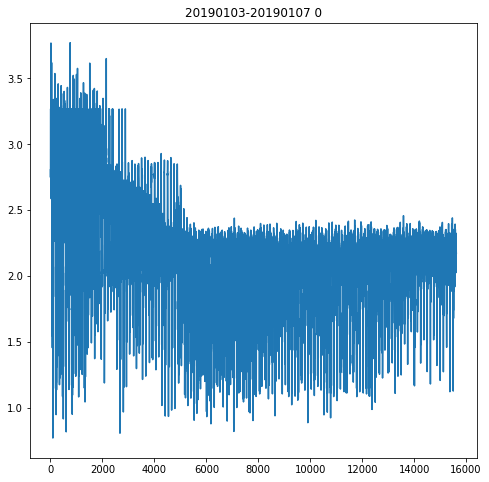

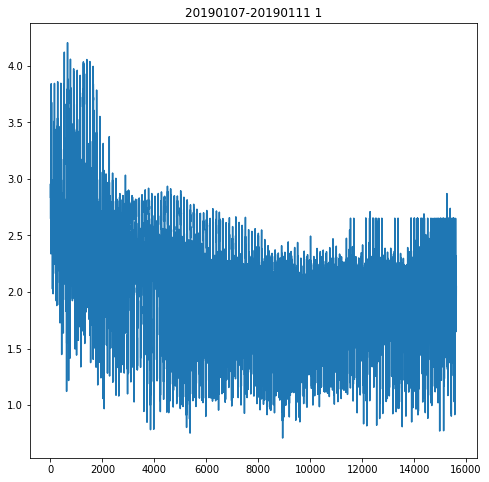

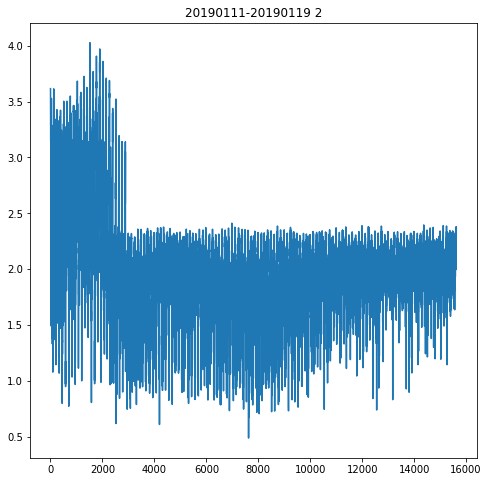

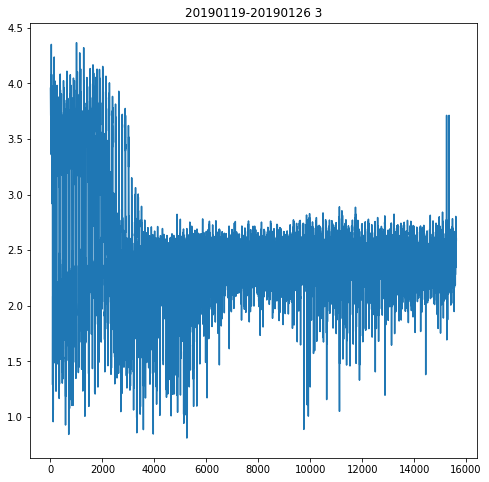

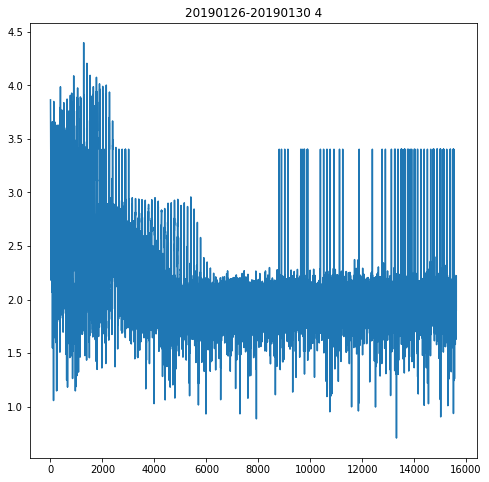

...

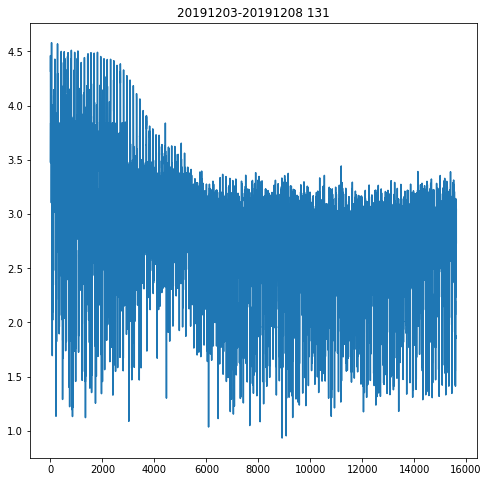

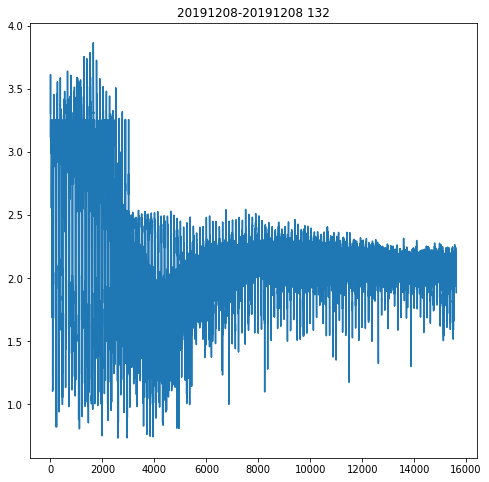

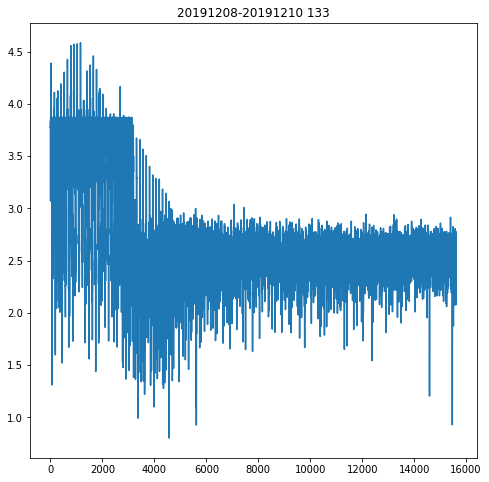

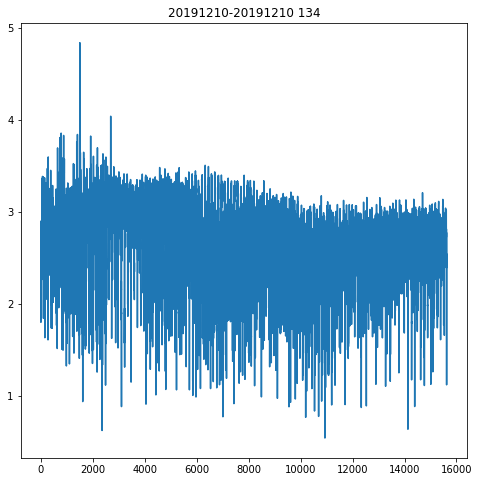

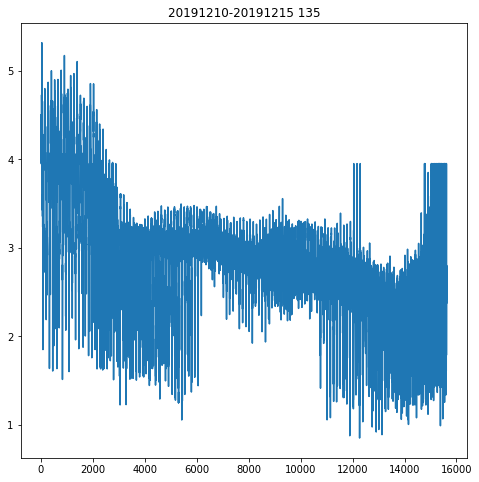

In [10]:
for i in range(len(time_detect)):
    plt.figure(figsize=(8, 8))
    plt.plot(time_detect[i]**0.1)
    plt.title(images_time[i]+' '+str(i))

/home/courtois/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in power
  import sys


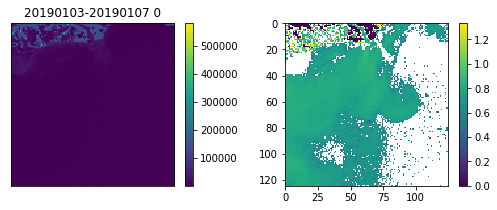

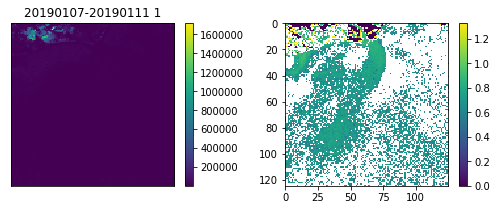

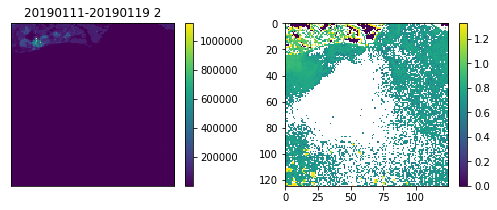

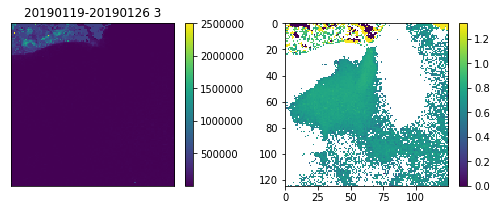

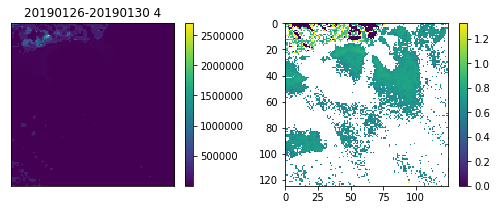

...

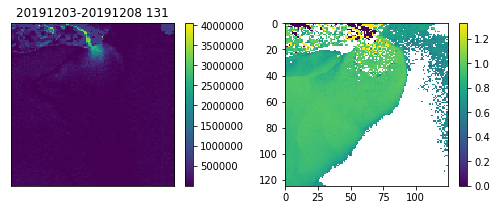

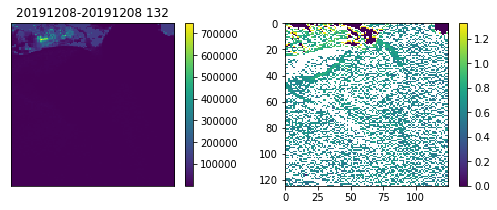

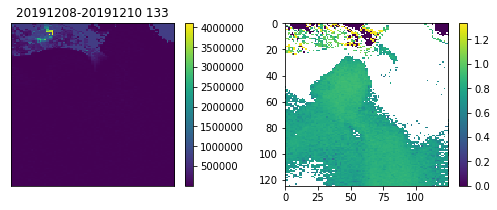

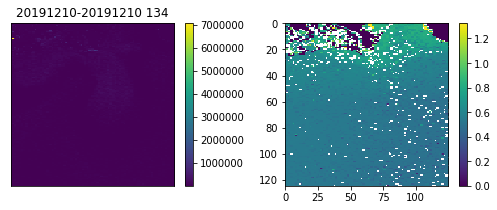

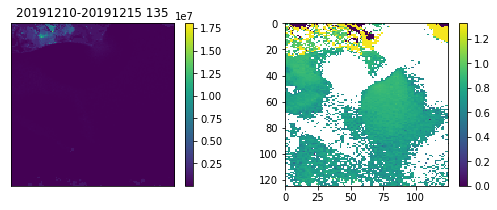

In [11]:
for i in range(len(time_detectf)):
    Tf2d = np.reshape(time_detect[i].T,(125,125))
    #plt.figure(figsize=(8, 8)) # adjusting the figure window size
    
    fig, (ax1, ax2) = plt.subplots(figsize=(9, 3), ncols=2)
    pos = ax1.imshow(Tf2d, cmap = cm.viridis) 
    wlgpw = ax2.imshow(sumdif[i]**0.1, cmap = cm.viridis)  
    fig.colorbar(pos,ax=ax1)
    fig.colorbar(wlgpw,ax=ax2)
    pos.axes.set_title(images_time[i]+' '+str(i))
    pos.axes.get_xaxis().set_visible(False)
    pos.axes.get_yaxis().set_visible(False)
    plt.show()